In [15]:
!pip install contextily
!pip install mapclassify
!pip install folium
!pip install fiona

  Using cached fiona-1.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (56 kB)
Using cached fiona-1.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)


<p align="center">
  <span style="color:Navy; font-size:200%; font-weight:bold; vertical-align:middle;">
    Temas Selectos: Python para Ciencias de la Tierra
  </span>
  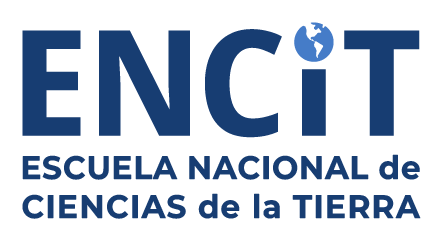
</p>
<p align="center" style="line-height:1.2;">
  <span style="color:RoyalBlue; font-size:160%;">Tema 3: MAnálisis Geoespacial de Datos</span><br/>
  <span style="color:DodgerBlue; font-size:140%;"> Técnicas de análisis raster y vectorial </span><br/>
  <span style="font-size:100%;color:forestgreen"> Escuela Nacional de Ciencias de la Tierra  |  Semestre 2026-I</span>
</p>

---


# **<font color="ForestGreen"> Coordinate Reference sustem (CRS) </font>**

## **<font color="SeaGreen"> Coordenadas geográficas </font>**

> Definimos una posición en el planeata en grados de latitud y longitud, relativos al ecuador y al primer meridiano. Con este sistema podemos especificar cualquier ubicación en el planeta.



<div class="alert alert-block alert-info">
<b>Nota:</b> Cuidado, en python se usa el orden (longitud, latitud). Además la longitud está en un grando de -180 a 180 grados, y la latitud en un rango de 90 a -90 grados.
</div>

## **<font color="SeaGreen"> Coordenadas proyectadas </font>**
> Usualmente proyectamos el planeata en 2D para poder expresar ubicaciones en cooredenadas cartesianas x y y. 

Para minimizar el error de la proyección, existen distintas proyecciones: 
- Proyección de área iguales de Albert
- La proyección Mercator


Una representación es la `proj4` string, en python es representada como un diccionario. 
Por ejemplo: 

`+proj = lonlat +datum=WGS84 +nodefs`

`{'proj': 'latlon','datum':'WGS84','no_defs':True}`


La mayoría de los datos están representados en el sistema EPSG
`+EPSG:4326` = WGS84 CRS geográfico (longitud,latitud)

En GeoPandas, la información del CRS se guarda en el atributo `crs`, lo que regresa es la proyección en un string o diccionario.

`geo_df = geopandas.read_file("archivo.shp")`

`+print(geo_df.crs)`
imprime

`{'init':'epsg:4326'}`



In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
import contextily
import geopandas

from shapely.geometry import Point
import mapclassify

In [ ]:
# Importen el archivo paris_districts_utm.geojson
districts = ____________

# Impriman la información del CRS
print(____)

# Impriman las primeras filas del GeoDataFrame
print(____)

In [2]:
# Importen el archivo paris_districts_utm.geojson
districts = geopandas.read_file("/home/jovyan/Unidad_3/Paris/paris_districts_utm.geojson")

# Impriman la información del CRS
print(districts.crs)

# Impriman las primeras filas del GeoDataFrame
print(districts.head())

EPSG:32631
   id           district_name  population  \
0   1  St-Germain-l'Auxerrois        1672   
1   2                  Halles        8984   
2   3            Palais-Royal        3195   
3   4           Place-Vendôme        3044   
4   5                 Gaillon        1345   

                                            geometry  
0  POLYGON ((451922.133 5411438.484, 451922.08 54...  
1  POLYGON ((452278.419 5412160.893, 452192.407 5...  
2  POLYGON ((451553.806 5412340.522, 451528.058 5...  
3  POLYGON ((451004.908 5412654.095, 450960.64 54...  
4  POLYGON ((451328.752 5412991.278, 451294.721 5...  


## **<font color="SeaGreen"> Datos ráster vs datos vectoriales </font>**

Si no hay información sobre el tipo de CRS, se puede poner manualmante con el método `to_crs`.
Por ejemplo: 

`geo_df2 = geo_df.to_crs({'proj':'lonlat','datum':'WGS84','no_defs':True})` 

o 

`geo_df2 = geo_df.to_crs(epsg=4326)`

Recuerden que pueden usar el CRS de otro GeoDataFrame para llevar sus datos al mismo CRS

`geo_df2 = geo_df2.to_crs(geo_df1.crs)`


Recuerden que la elección del CRS depende del objetivo de su análisis. 


Sitios de interés:
https://spatialreference.org/
https://epsg.io/


In [ ]:
# Creen el GeoDataFrame districts_lonlat usando el EPSG 4326

districts_lonlat = _________________

#impriman el CRS
________________________

In [4]:
# Creen el GeoDataFrame districts_lonlat usando el EPSG 4326
districts_lonlat = districts.to_crs(epsg=4326)

#impriman el CRS
districts_lonlat.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Vamos a ver la diferencia entre tres proyecciones:

1. Impriman el CRS de districts, y districts_lonlat
2. Muestren un mapa de districts
3. Conviertan districts a otra proyección CRS (EPSG:2154), este nuevo dataset se llamará districts_RGF93.
4. Creen un mapa para districts_RGF93.
5. Creen un mapa para districts_lonlat.

¿Ven alguna diferencia?


In [ ]:
# Impriman el CRS de districts
print(districts.crs)

# Muestren el mapa
districts.plot()
plt.show()

# Conviertan districts al CRS RGF93
districts_RGF93 = districts.____

# Muestren el mapa de districts_RGF93
districts_RGF93.____
plt.show()

# Muestren el mapa de districts_lonlat
_________
_______

EPSG:32631


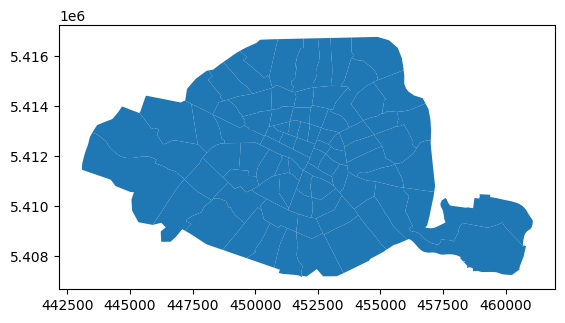

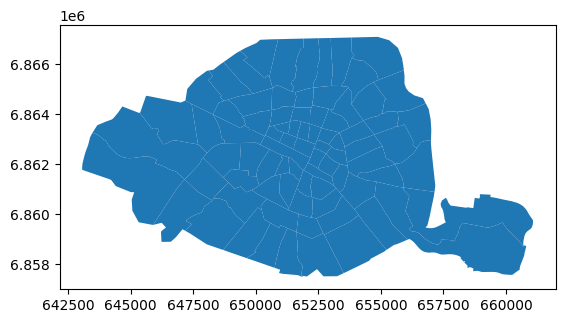

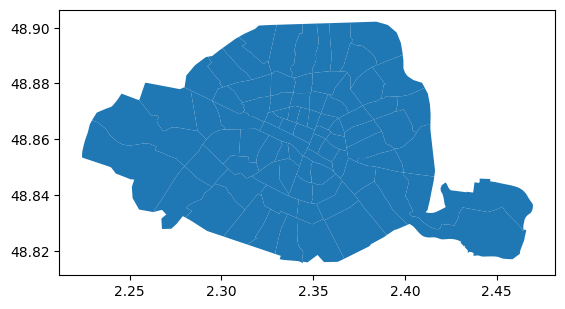

In [5]:
# Print the CRS information
print(districts.crs)

# Plot the districts dataset
districts.plot()
plt.show()

# Convert the districts to the RGF93 reference system
districts_RGF93 = districts.to_crs(epsg=2154)

# Plot the districts dataset again
districts_RGF93.plot()
plt.show()

# Plot the districts dataset again
districts_lonlat.plot()
plt.show()

## **<font color="SeaGreen"> Proyectando un punto. </font>**

En el notebook anterior, trabajamos con la ubicación de la Torre Eiffel. Nuevamente, proporcionamos las coordenadas en un sistema de coordenadas proyectadas para que, por ejemplo, se puedan calcular distancias. Volvamos a este emblemático monumento y expresemos su ubicación en coordenadas geográficas: 48°51′29.6″N, 2°17′40.2″E. O, en decimales: latitud 48.8584 y longitud 2.2945.

Los objetos geométricos Shapely no tienen noción de CRS y, por lo tanto, no se pueden convertir directamente a otro CRS. Por lo tanto, usaremos GeoPandas para transformar la ubicación del punto de la Torre Eiffel en un CRS alternativo. Introduciremos el punto en una GeoSeries, usaremos el método `to_crs()` y extraeremos el punto de nuevo.


* Creen un objeto POINT en shapely con las coordenadas de la Torre Eiffel y asígnelo a una variable llamada eiffel_tower.
* Creen una GeoSeries (llamada s_eiffel_tower) con la Torre Eiffel como único elemento y especifique el CRS EPSG:4326.
* Conviertan s_eiffel_tower a EPSG:2154 y llamen al resultado s_eiffel_tower_projected.


In [ ]:
# Construyan un punto para la Torre Eiffel
eiffel_tower = ____

# Conviertan el punto en una GeoSeries con el CRS correcto
s_eiffel_tower = geopandas.GeoSeries([____], crs='____')

# Conviertan el punto a un CRS EPSG 2154
s_eiffel_tower_projected = s_eiffel_tower.____

# Impriman el punto
print(s_eiffel_tower_projected)

In [6]:
# Construct a Point object for the Eiffel Tower
eiffel_tower = Point(2.2945,48.8584)
# Put the point in a GeoSeries with the correct CRS
s_eiffel_tower = geopandas.GeoSeries([eiffel_tower], crs='EPSG:4326')
# Convert to other CRS
s_eiffel_tower_projected = s_eiffel_tower.to_crs(epsg=2154)

# Print the projected point
print(s_eiffel_tower_projected)

0    POINT (648237.302 6862271.682)
dtype: geometry


## **<font color="SeaGreen"> Cálculo de la distancia en un sistema de coordenadas proyectado </font>**



Ahora que tenemos la ubicación de la Torre Eiffel en un sistema de coordenadas proyectado, podemos calcular la distancia a otros puntos.

Usaremos el último objeto `s_eiffel_tower_projected` del ejercicio anterior, que contiene el punto proyectado, y extraemos el punto único en la variable `eiffel_tower`. Además, también usaremos el dataframe de restaurantes (utilizando coordenadas WGS84).

1. Sube el archivo "paris_restaurants.csv" y conviértelo a un GeoDataFrame.
2. Convierte el GeoDataFrame al mismo CRS que el punto de la Torre Eiffel. Para este ejercicio, no especifiques la palabra clave epsg, sino el atributo .crs.
3. Calcula la distancia de todos los restaurantes a la Torre Eiffel.
4. Imprime la distancia más pequeña.

In [ ]:
# Leemos el archivo csv
df =___________________________

# Convertir df a un GeoDataFrame
restaurants = geopandas.GeoDataFrame( df, geometry=geopandas.points_from_xy(df['x'], df['y']), crs="EPSG:32633"   # WGS84 (lat/lon)
                                        )
# muestren las primeras 5 filas. 
#Conviertan el CRS del punto s_eiffel_tower al mismo que restaurants 
s_eiffel_tower_projected = __________________.to_crs(__________.crs)
eiffel_tower = _______________________.iloc[0]

#Calculen la distancia de cada restaurante al torre Eiffel
dist_eiffel = _________________.distance(__________)
#Impriman las distancias
_______________________________

# Impriman la distancia mínima
________________________________

In [9]:
# Leemos el archivo csv
df = pd.read_csv("/home/jovyan/Unidad_3/Paris/paris_restaurants.csv")

# Convertir df a un GeoDataFrame
# Ejemplo: geometry a partir de columnas x, y o lon, lat
restaurants = geopandas.GeoDataFrame(
    df,
    geometry=geopandas.points_from_xy(df['x'], df['y']),
    crs="EPSG:32633"   # WGS84 (lat/lon)
)
#restaurants = geopandas.GeoSeries(df, crs="EPSG:4326")

In [10]:
restaurants.head()

,type,x,y,geometry
0,European restuarant,259641.691646,6.251867e+06,POINT (259641.692 6251867.063)
1,Traditional French restaurant,259572.339603,6.252030e+06,POINT (259572.34 6252029.683)
2,Traditional French restaurant,259657.276374,6.252143e+06,POINT (259657.276 6252143.401)
3,Indian / Middle Eastern restaurant,259684.438330,6.252203e+06,POINT (259684.438 6252203.137)
4,Traditional French restaurant,259597.943086,6.252230e+06,POINT (259597.943 6252230.044)


In [12]:
s_eiffel_tower_projected = s_eiffel_tower.to_crs(restaurants.crs)
eiffel_tower = s_eiffel_tower_projected.iloc[0]
dist_eiffel = restaurants.distance(eiffel_tower)
dist_eiffel

0       1.028192e+06
1       1.028266e+06
2       1.028407e+06
3       1.028470e+06
4       1.028431e+06
            ...     
5730    1.029290e+06
5731    1.029345e+06
5732    1.033034e+06
5733    1.033040e+06
5734    1.032425e+06
Length: 5735, dtype: float64

In [13]:
# The distance to the closest restaurant
print(dist_eiffel.min())

1019296.5666782534


### **<font color="SeaGreen"> Operaciones espaciales: creación de nuevas geometrías </font>**

De manera similar a la clase pasada, podemos hacer ciertas operaciones con poligonos, por ejemplo:


**1. Obtener intersecciones de poligonos:**

![intersec](intersection.png)


**2. Obtener uniones y**

![union](union.png)


**3. Obtener diferencias.**

![dif](dif.png)

### **<font color="SeaGreen"> Datos de uso del suelo </font>**

Para los siguientes ejercicios, primero presentamos un nuevo conjunto de datos: un conjunto de datos sobre el uso del suelo de París. El uso del suelo indica para qué tipo de actividad se utiliza una zona determinada, como residencial o recreativa. Se trata de un conjunto de datos multipoligonal, con una etiqueta que representa la clase de uso del suelo para las diferentes zonas de París.

En este ejercicio, leeremos los datos, los exploraremos visualmente y calcularemos la superficie total de las diferentes clases de uso del suelo en la zona de París.

Esta base de datos viene de: https://land.copernicus.eu/en/products/urban-atlas

* Lea el archivo 'FR001L1_PARIS_UA2012_revised_v021.gpkg' y asigne el resultado a la variable land_use.
* Genere un gráfico de land_use, usando la columna 'class_2012' para colorear los polígonos. También agregamos una leyenda. 
>Nota: El gráfico puede tardar unos segundos en generarse debido a la gran cantidad de polígonos.

* Agregue una nueva columna 'area' con el área de cada polígono.
* Calcule el área total en km² para cada 'class_2012' usando el método groupby() e imprima el resultado.

In [ ]:
import zipfile
import os

zip_path = '22178.zip'  # Cambia esto por la ruta real
extract_to = '/home/'  # Carpeta donde se extraerán los archivos

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

In [ ]:
directorio_interno = '/home/.../Results/'


if zip_interno:
    with zipfile.ZipFile(zip_interno, 'r') as zip_ref:
        zip_ref.extractall(directorio_interno)
else:
    print('No se encontró un archivo ZIP interno.')

In [16]:
import zipfile
import os

zip_path = '/home/jovyan/Unidad_3/22178.zip'  # Cambia esto por la ruta real
extract_to = '/home/jovyan/Unidad_3/'  # Carpeta donde se extraerán los archivos

In [17]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

In [19]:
directorio_interno = '/home/jovyan/Unidad_3/Results/'
zip_interno = '/home/jovyan/Unidad_3/Results/FR001L1_PARIS_UA2012_revised_v021.zip'
if zip_interno:
    with zipfile.ZipFile(zip_interno, 'r') as zip_ref:
        zip_ref.extractall(directorio_interno)
else:
    print('No se encontró un archivo ZIP interno.')


In [16]:
import fiona
# Antes de abrir su archivo, tiene que saber que, aveces las bases de datos vienen en capas, 
# para ver las capa que contiene nuestra bes podemos usar la siguiente libreria y funcion

layers = fiona.listlayers('/home/jovyan/Unidad_3/Results/FR001L1_PARIS_UA2012_revised_v021/Data/FR001L1_PARIS_UA2012_revised_v021.gpkg')
print(layers)


['FR001L1_PARIS_UA2012_revised', 'FR001L1_PARIS_UA2012_revised_Boundary', 'FR001L1_PARIS_UA2012_revised_UrbanCore']


In [18]:
#import geopandas as gpd

# Para leer la capa principal
land_use = geopandas.read_file('/home/jovyan/Unidad_3/Results/FR001L1_PARIS_UA2012_revised_v021/Data/FR001L1_PARIS_UA2012_revised_v021.gpkg', layer='FR001L1_PARIS_UA2012_revised')

# Para leer la capa de límites
boundary = geopandas.read_file('/home/jovyan/Unidad_3/Results/FR001L1_PARIS_UA2012_revised_v021/Data/FR001L1_PARIS_UA2012_revised_v021.gpkg', layer='FR001L1_PARIS_UA2012_revised_Boundary')

# Para leer la capa del núcleo urbano
urban_core = geopandas.read_file('/home/jovyan/Unidad_3/Results/FR001L1_PARIS_UA2012_revised_v021/Data/FR001L1_PARIS_UA2012_revised_v021.gpkg', layer='FR001L1_PARIS_UA2012_revised_UrbanCore')

In [19]:
land_use.head()

,country,fua_name,fua_code,code_2012,class_2012,prod_date,identifier,perimeter,area,comment,Pop2012,geometry
0,FR,Paris,FR001L1,11220,Discontinuous medium density urban fabric (S.L...,2020-09,59856-FR001L1,3239.214688,69512.517102,None,245,"MULTIPOLYGON (((3766403.313 2865861.102, 37664..."
1,FR,Paris,FR001L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,35716-FR001L1,3683.301943,85542.006098,None,582,"MULTIPOLYGON (((3737000 2881423.178, 3737133.2..."
2,FR,Paris,FR001L1,11220,Discontinuous medium density urban fabric (S.L...,2020-09,63106-FR001L1,1947.727258,46238.905137,None,269,"MULTIPOLYGON (((3738341.211 2882811.812, 37383..."
3,FR,Paris,FR001L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,50109-FR001L1,2896.906914,61729.358691,None,505,"MULTIPOLYGON (((3725829.731 2904000, 3725829.5..."
4,FR,Paris,FR001L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,34769-FR001L1,3492.680561,76894.419482,None,543,"MULTIPOLYGON (((3779087.644 2879410.388, 37790..."


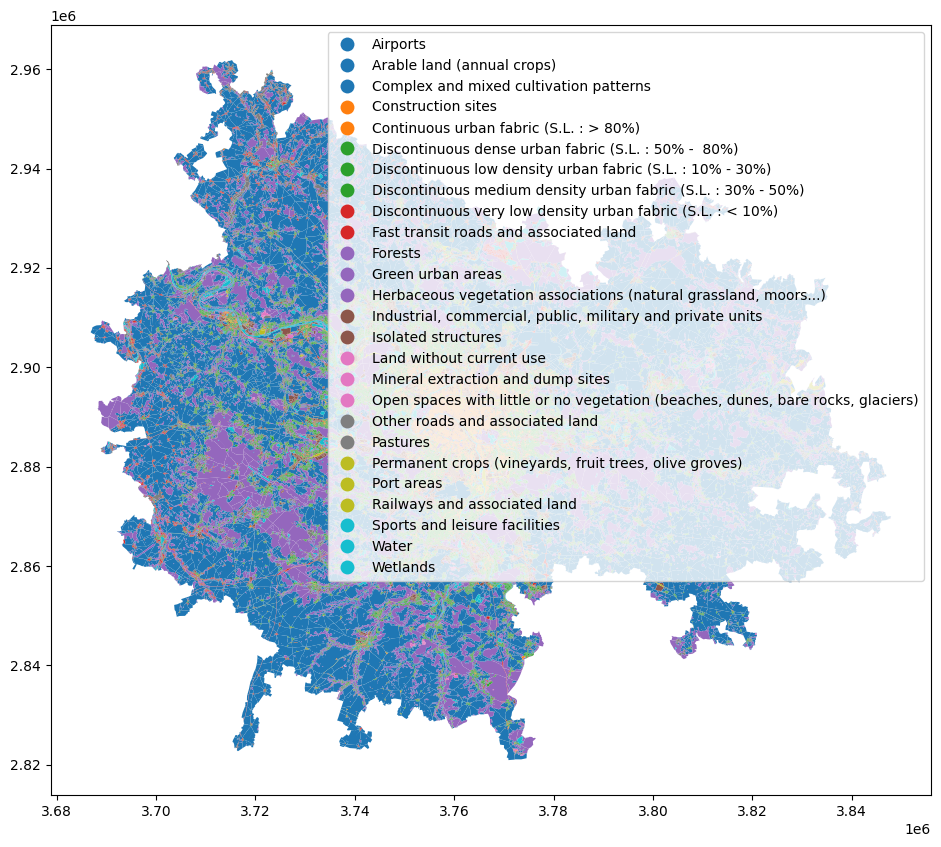

In [14]:
#Creen un mapa para land_use de modo se coloree considerando el tipo de uso de suelo ('class_2012')
# Make a plot of the land use with 'class' as the color
land_use.plot(column='class_2012', legend=True, figsize=(15, 10))
plt.show()


In [ ]:
#Creen otra columna donde midan el area de cada geometria
_______________________________

In [ ]:
# Agrupen land_use considerando el tipo de uso y calculen el area de cada clase en km2.
total_area = 
total_area

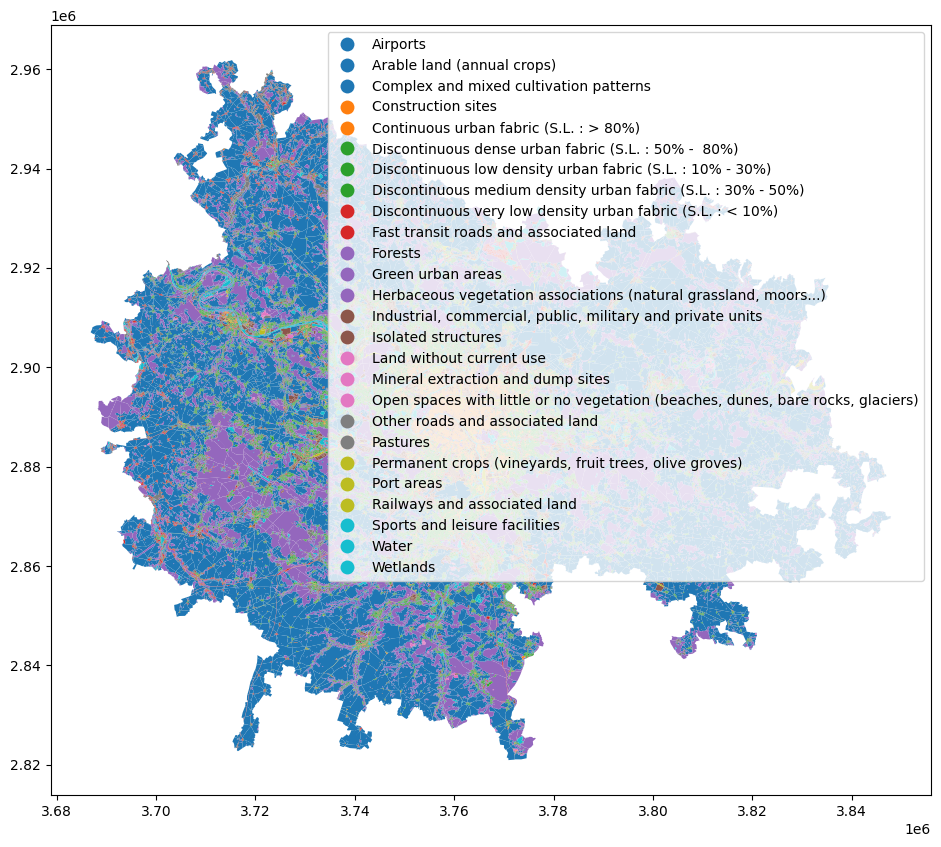

class_2012
Airports                                                                             69.973548
Arable land (annual crops)                                                         6182.848221
Complex and mixed cultivation patterns                                                0.781338
Construction sites                                                                   14.522172
Continuous urban fabric (S.L. : > 80%)                                              222.131187
Discontinuous dense urban fabric (S.L. : 50% -  80%)                                531.758994
Discontinuous low density urban fabric (S.L. : 10% - 30%)                           150.068569
Discontinuous medium density urban fabric (S.L. : 30% - 50%)                        311.633005
Discontinuous very low density urban fabric (S.L. : < 10%)                          131.002326
Fast transit roads and associated land                                               34.476144
Forests                                

In [20]:
# Make a plot of the land use with 'class' as the color
land_use.plot(column = 'class_2012', legend=True, legend_kwds={'loc': 'upper right'}
,figsize=(15, 10))
plt.show()

# Add the area as a new column
land_use['area'] = land_use.geometry.area

# Calculate the total area for each land use class
total_area = land_use.groupby('class_2012')['area'].sum() / 1000**2
total_area

### **<font color="SeaGreen"> Intersección de dos polígonos </font>**


Para este ejercicio, utilizaremos dos polígonos individuales: el distrito de Muette, que extraeremos del conjunto de datos `"districts"`, y un parque público al oeste de París, que extraeremos del conjunto de datos `"land_use"`.



In [21]:
districts.head()

,id,district_name,population,geometry
0,1,St-Germain-l'Auxerrois,1672,"POLYGON ((451922.133 5411438.484, 451922.08 54..."
1,2,Halles,8984,"POLYGON ((452278.419 5412160.893, 452192.407 5..."
2,3,Palais-Royal,3195,"POLYGON ((451553.806 5412340.522, 451528.058 5..."
3,4,Place-Vendôme,3044,"POLYGON ((451004.908 5412654.095, 450960.64 54..."
4,5,Gaillon,1345,"POLYGON ((451328.752 5412991.278, 451294.721 5..."


In [33]:
# Primero extrae el distrito 'Muette' de districts
muette =__________________________________________________
muette

In [22]:
# Primero extrae el distrito 'Muette' de districts
muette = districts[districts['district_name']=='Muette']
muette

,id,district_name,population,geometry
61,62,Muette,45214,"POLYGON ((444686.86 5413985.234, 445358.893 54..."


In [130]:
# Ahora van a extraer las areas verdes urbanas 'Green urban areas' de land_use 
green_areas = ___________________________________________________________
#green_areas

<Axes: >

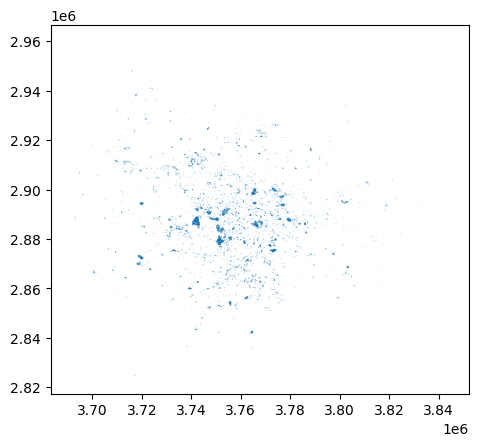

In [23]:
# Ahora van a extraer las areas verdes urbanas 'Green urban areas' de land_use 

green_areas = land_use[land_use['class_2012']=='Green urban areas']
green_areas.plot()

In [ ]:
# Si quisieran explorar todas las areas verdes de Paris, recuerden esta herramienta
#green_areas.explore() 

In [98]:
# No queremos trabajar con todas las areas, asi que extraeremos un parque de green_areas
# Extraigan el dato cuyo identificador es '149138-FR001L1'
parque =___________________________________________
parque

,country,fua_name,fua_code,code_2012,class_2012,prod_date,identifier,perimeter,area,comment,Pop2012,geometry
5531,FR,Paris,FR001L1,14100,Green urban areas,2020-09,149138-FR001L1,510.522552,11357.733148,None,0,"MULTIPOLYGON (((3756307.149 2890342.264, 37562..."


In [25]:
# No queremos trabajar con todas las areas, asi que extraeremos un parque de green_areas
# Extraigan el dato cuyo identificador es '149138-FR001L1'
parque = green_areas[green_areas['identifier'] == '149138-FR001L1']
parque

,country,fua_name,fua_code,code_2012,class_2012,prod_date,identifier,perimeter,area,comment,Pop2012,geometry
5531,FR,Paris,FR001L1,14100,Green urban areas,2020-09,149138-FR001L1,510.522552,11357.733148,None,0,"MULTIPOLYGON (((3756307.149 2890342.264, 37562..."


In [115]:
## Antes de hacer cualquier cosa, debemos asegurarnos que ambos poligonos tengan el mismo crs
print(__________)
print(__________)

EPSG:3035
EPSG:32631


In [26]:
## Antes de hacer cualquier cosa, debemos asegurarnos que ambos poligonos tengan el mismo crs
print(parque.crs)
print(muette.crs)

EPSG:3035
EPSG:32631


In [116]:
# Si no es el mismo, conviertan el crs de muette para que tenga el crs de parque
muette = ________________________

In [27]:
# Si no es el mismo, conviertan el crs de muette para que tenga el crs de parque
muette = muette.to_crs(parque.crs)

##### **Ya tenemos los dos sitios que queremos estudiar**

Ahora, vamos a:
* Trazar los dos polígonos en un solo mapa para examinar visualmente el grado de superposición.
* Calcular la intersección de los polígonos del parque y del distrito Muette.
* Carlular la proporción del área del distrito que ocupa el parque.

> NOTA: parque es un multipoligono y muette es un poligono, esto nos puede causar problemas para poder visualizarlo y hacer operaciones.
> Siempre deben verificar el tipo de geometrias que tienen sus objetos. 

In [28]:
muette.geometry

61    POLYGON ((3753224.021 2892487.772, 3753868.704...
Name: geometry, dtype: geometry

In [29]:
parque.geometry

5531    MULTIPOLYGON (((3756307.149 2890342.264, 37562...
Name: geometry, dtype: geometry

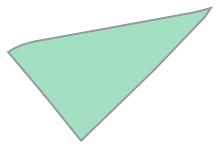

In [30]:
# Como parque es un multipoligono y muette un poligono, debemos llevar a parque a la misma geometria que muette.
parque_union = parque.union_all()
parque_union

In [31]:
# Si tenemos dudas de si hemos hecho algo mal en la extraccion de informacion, podemos usar esto
print(parque.geometry.is_empty.any())
print(muette.geometry.is_empty.any())

False
False


Ahora, visualicemos los dos polígonos.


Tenemos dos formas de hacerlo.

Verán que se superponen.



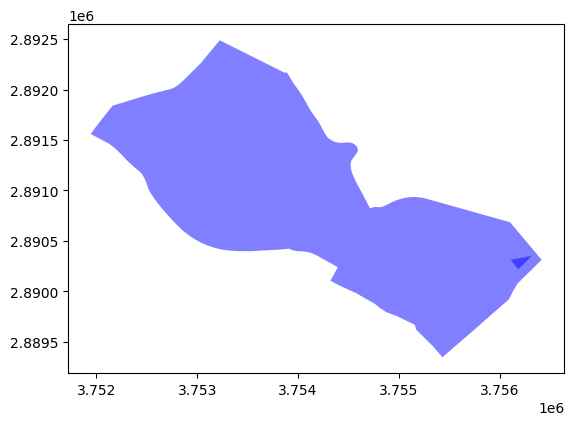

In [32]:
parque_geom = parque.geometry.iloc[0]
muette_geom = muette.geometry.iloc[0]

geopandas.GeoSeries([parque_geom, muette_geom]).plot(alpha=0.5, color='blue')
plt.show()


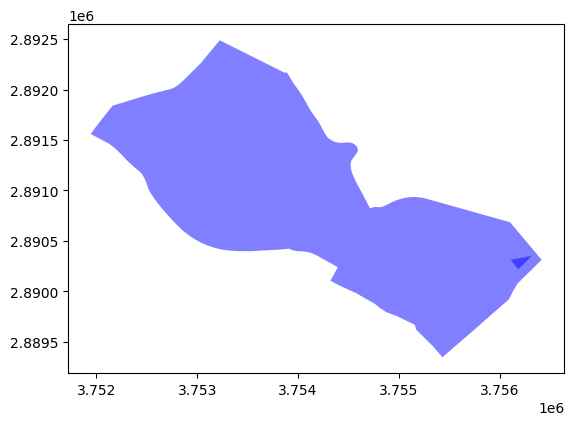

In [33]:
parque_geom = parque.union_all()
muette_geom = muette.union_all()

geopandas.GeoSeries([parque_geom, muette_geom]).plot(alpha=0.5, color= 'blue')
plt.show()


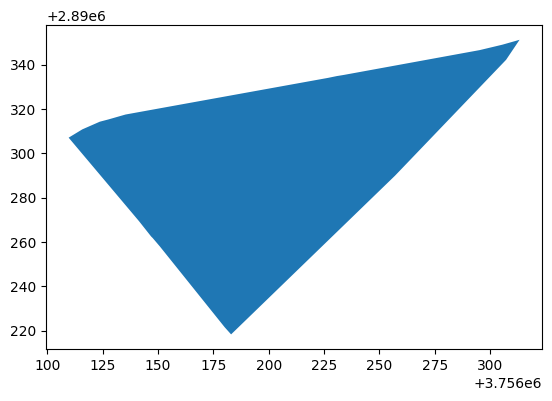

0.002072948768172278


In [146]:
# Ahora, calcularemos la interseccion de estos poligonos. 
# En este caso, tenemos que usar las geometrias 

intersection = parque_geom.intersection(muette_geom)

# Ahora, grafiquen la interseccion 
geopandas.GeoSeries(________________).plot()
plt.show()

# Calculen la proporcion del area del distrito que esta ocupada por el parque
print(_____________________ / _____________________ )

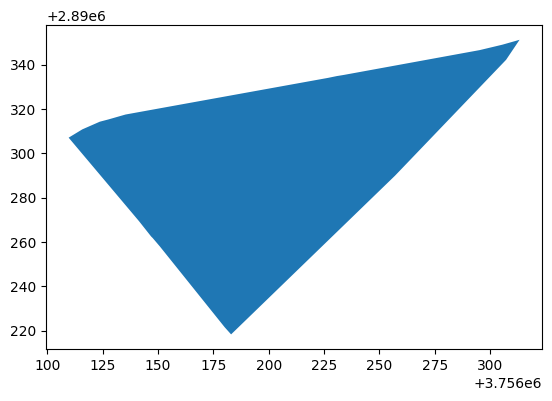

0.002072948768172278


In [34]:
# Ahora, calcularemos la interseccion de estos poligonos. 
# En este caso, tenemos que usar las geometrias 

intersection = parque_geom.intersection(muette_geom)

# Ahora, grafiquen la interseccion 
geopandas.GeoSeries(intersection).plot()
plt.show()

# Calculen la proporcion del area del distrito que esta ocupada por el parque
print(intersection.area / muette_geom.area)

Tal vez ahora no parezca de mucha utilidad calcular la interseccion, pero si el parque estuviera en dos distritos diferentes, nos daria una idea de cual distrito tiene mas area de parque. 

Otra forma de ver el area que ocupa el parque es graficando la diferencia. 

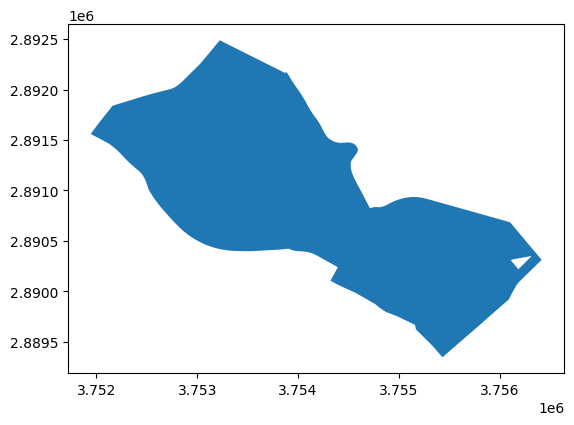

In [152]:
# Ahora, quiten el area del parque al distrito muette.

difer = ___________.difference(___________)

# Ahora, grafiquen el resultado 
geopandas.GeoSeries(_______).plot()
plt.show()


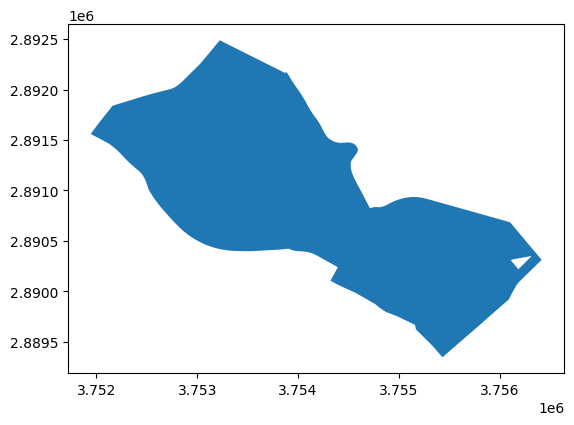

In [35]:
# Ahora, quiten el area del parque al distrito muette.

difer = muette_geom.difference(parque_geom)

# Ahora, grafiquen el resultado 
geopandas.GeoSeries(difer).plot()
plt.show()


---
### **<font color="SeaGreen"> Intersección de un GeoDataFrame con un polígono </font>**

Al combinar los conjuntos de datos de uso del suelo y de distritos, podemos investigar el uso del suelo en un distrito determinado.

Para ello, primero debemos determinar la intersección de los conjuntos de datos de uso del suelo con un distrito determinado. Tomemos como ejemplo el distrito de Muette.

1. Calcula la intersección de los polígonos land_use con el polígono muette. Llama al resultado land_use_muette.
2. Gráfica rápidamente esta intersección y pasa edgecolor='black' para ver con mayor claridad los límites de los diferentes polígonos.
3. Imprime las primeras cinco filas de land_use_muette.



In [156]:
# Si quisieran explorar todas las areas verdes de Paris, recuerden esta herramienta
#green_areas.explore() 

In [36]:
print(green_areas.crs)
print(muette.crs)

EPSG:3035
EPSG:3035


In [ ]:
# Antes de hacer la interseccion, debemos asegurarnos que ambos GeoDataFrames tengan el mismo CRS
#Imprime los CRS de cada GeoDataFrame


#Si no coinciden, haz que muette tenga el mismo CRS que land_use
______________________

In [37]:
# Para hacer la interseccion de los dos GeoDataFrames usaremos una nueva funcion de geopandas
# Esta nos permitira crear un nuevo GeoDataFrame a partir de dos, pueden usar  ‘intersection’, ‘union’, ‘identity’, ‘symmetric_difference’ or ‘difference’.
# Recuerden que sjoin tambien puede ayudar
land_use_muette =  geopandas.overlay(land_use, muette, how='intersection')

#impriman las primeras filas de land_use_muette
land_use_muette.head()

,country,fua_name,fua_code,code_2012,class_2012,prod_date,identifier,perimeter,area,comment,Pop2012,id,district_name,population,geometry
0,FR,Paris,FR001L1,12220,Other roads and associated land,2020-09,187096-FR001L1,7.850703e+07,3.425246e+08,None,0,62,Muette,45214,"MULTIPOLYGON (((3755311.835 2889480.685, 37553..."
1,FR,Paris,FR001L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,11808-FR001L1,3.118784e+02,5.504105e+03,None,241,62,Muette,45214,"POLYGON ((3755753.749 2890207.265, 3755742.542..."
2,FR,Paris,FR001L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,11580-FR001L1,1.993798e+02,2.514228e+03,None,83,62,Muette,45214,"POLYGON ((3754932.776 2890031.667, 3754914.976..."
3,FR,Paris,FR001L1,14100,Green urban areas,2020-09,149138-FR001L1,5.105226e+02,1.135773e+04,None,0,62,Muette,45214,"POLYGON ((3756257.007 2890289.956, 3756183.012..."
4,FR,Paris,FR001L1,50000,Water,2020-09,185927-FR001L1,4.330391e+02,1.072372e+04,None,0,62,Muette,45214,"POLYGON ((3752872.317 2890994.468, 3752859.766..."


In [ ]:
# Gráfica esta intersección y pasa edgecolor='black' para ver con mayor claridad los límites de los diferentes polígonos.
______________________________

In [ ]:
# Gráfica esta intersección, ahora que se coloree por tipo de uso y pasa edgecolor='black' para ver con mayor claridad los límites de los diferentes polígonos.
______________________________

In [38]:
#Si no coinciden, haz que muette tenga el mismo CRS que land_use
muette = muette.to_crs(land_use.crs)
land_use_muette =  geopandas.overlay(land_use, muette, how='intersection')
land_use_muette.head()

,country,fua_name,fua_code,code_2012,class_2012,prod_date,identifier,perimeter,area,comment,Pop2012,id,district_name,population,geometry
0,FR,Paris,FR001L1,12220,Other roads and associated land,2020-09,187096-FR001L1,7.850703e+07,3.425246e+08,None,0,62,Muette,45214,"MULTIPOLYGON (((3755311.835 2889480.685, 37553..."
1,FR,Paris,FR001L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,11808-FR001L1,3.118784e+02,5.504105e+03,None,241,62,Muette,45214,"POLYGON ((3755753.749 2890207.265, 3755742.542..."
2,FR,Paris,FR001L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,11580-FR001L1,1.993798e+02,2.514228e+03,None,83,62,Muette,45214,"POLYGON ((3754932.776 2890031.667, 3754914.976..."
3,FR,Paris,FR001L1,14100,Green urban areas,2020-09,149138-FR001L1,5.105226e+02,1.135773e+04,None,0,62,Muette,45214,"POLYGON ((3756257.007 2890289.956, 3756183.012..."
4,FR,Paris,FR001L1,50000,Water,2020-09,185927-FR001L1,4.330391e+02,1.072372e+04,None,0,62,Muette,45214,"POLYGON ((3752872.317 2890994.468, 3752859.766..."


<Axes: >

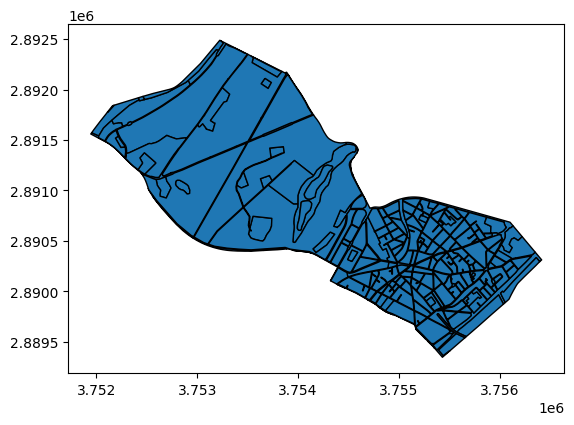

In [39]:
land_use_muette.plot(edgecolor='black' )

<Axes: >

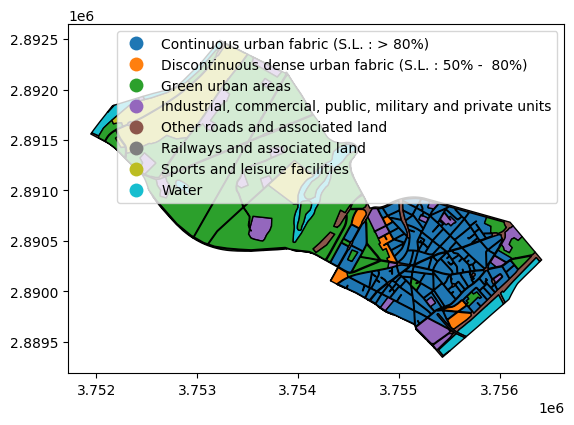

In [40]:
land_use_muette.plot(column='class_2012', legend =True,edgecolor='black')

### **<font color="SeaGreen"> Mineria en el congo </font>** 

En este ejercicio, comenzaremos leyendo y explorando dos nuevos conjuntos de datos:

Primero, un conjunto de datos sobre yacimientos de minería artesanal en el este del Congo (adaptado de los datos abiertos de IPIS).
https://ipisresearch.be/wp-content/uploads/2018/03/Open_Data_Tutorial.html
Segundo, un conjunto de datos sobre los parques nacionales del Congo (del Instituto de Recursos Mundiales).
https://cod-data.forest-atlas.org/

Para cada uno de estos conjuntos de datos, leen los datos con geopandas.read_file(), inspeccionen las primeras 5 filas y el Sistema de Referencia de Coordenadas (SRC) de los datos, y realicen una visualización rápida.

1. Extraigan los datos de Protected_areas.zip
2. Lean y exploren los datos del sitio minero ("ipis_cod_mines.geojson"), asignándolos a una variable llamada mining_sites.
3. Lean y exploren los datos de las área protegidas ("Protected_areas.shp") y asígnelo a national_parks

In [ ]:
# Lean las bases de datos
mining_sites = ___________________________
national_parks = _____________________________
# Impriman las primeras filas y el CRS de cada GeoDataFrame
print(____)
print(____)

# Creen un mapa rápido.
____
plt.show()

In [238]:
#zip_path = '/home/jovyan/Unidad_3/Protected_areas.zip'  # Cambia esto por la ruta real
#extract_to = '/home/jovyan/Unidad_3/'  # Carpeta donde se extraerán los archivos
#with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#    zip_ref.extractall(extract_to)

  visit_date                                name  n_workers mineral  \
0 2013-03-27                           Mayi-Tatu      150.0    Gold   
1 2013-03-27                             Mabanga      115.0    Gold   
2 2013-03-27                             Molende      130.0    Gold   
3 2013-03-27                          Embouchure      135.0    Gold   
4 2013-03-27  Apumu-Atandele-Jerusalem-Luka Yayo      270.0    Gold   

                   geometry  
0  POINT (29.66033 1.01089)  
1  POINT (29.65862 1.00308)  
2  POINT (29.65629 0.98563)  
3  POINT (29.64494 0.99976)  
4       POINT (29.66 0.956)  
EPSG:4326
   OBJECTID    type_                    desc_type  \
0        56  4120400                Parc national   
1        57  4100400         Réserve scientifique   
2        58  4120400                Parc national   
3        59  4100130  Réserve naturelle intégrale   
4        60  4100130  Réserve naturelle intégrale   

                                       nom_ap       nom_orig par

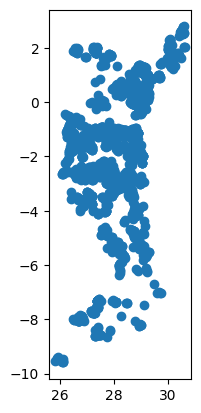

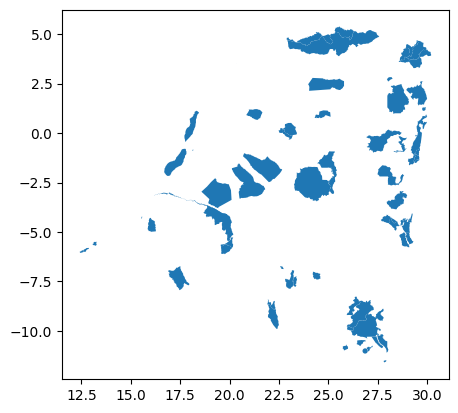

In [41]:
# Read the mining site data
mining_sites = geopandas.read_file("ipis_cod_mines.geojson")
national_parks = geopandas.read_file("/home/jovyan/Unidad_3/Protected_areas.shp")
# Print the first rows and the CRS information
print(mining_sites.head())
print(mining_sites.crs)

print(national_parks.head())
print(national_parks.crs)

# Make a quick visualisation
mining_sites.plot()
national_parks.plot()
plt.show()

### **<font color="SeaGreen"> Convertir a un SRC común y guardarlo en un archivo </font>** 

Como vimos en los ejercicios anteriores, ambos conjuntos de datos utilizan un Sistema de Referencia de Coordenadas (SRC) diferente. Esto también se ilustra en los primeros gráficos. Ambos conjuntos de datos se refieren a la misma región, por lo que normalmente deberían superponerse en sus coordenadas; pero no es así.

Para realizar los análisis, convertiremos ambos conjuntos de datos al mismo SRC y los guardaremos en un nuevo archivo. Para garantizar que podamos realizar cálculos basados en la distancia, los convertiremos a un SRC proyectado: la zona UTM local 35, identificada por EPSG:32735 (https://epsg.io/32735).
Entonces:
1. Convierta ambos conjuntos de datos (mining_sites y national_parks) a EPSG:32735.Asigne a los resultados el nombre mining_sites_utm y national_parks_utm.
2. Intente visualizar de nuevo ambos conjuntos de datos en un solo mapa. ¿Se superponen ahora ambos conjuntos de datos?

In [ ]:
# Convertir ambos GeoDataFrames al mismo CRS 
mining_sites_utm = ____
national_parks_utm = ____

# Mostrar el mapa de los datos con la proyección 
ax = national_parks_utm.plot()
mining_sites_utm.plot(ax=ax, color='red')
plt.show()

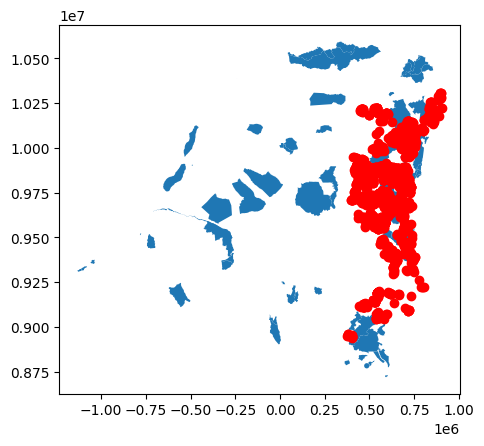

In [71]:
# Convert both datasets to UTM projection
mining_sites_utm = mining_sites.to_crs(epsg='32735')
national_parks_utm = national_parks.to_crs(epsg='32735')

# Plot the converted data again
ax = national_parks_utm.plot()
mining_sites_utm.plot(ax=ax, color='red')
plt.show()

## **Generar un archivo**

Escriba mining_sites_utm en un archivo GeoPackage llamado "ipis_cod_mines_utm.gpkg" y escriba national_parks_utm en un Shapefile ESRI llamado "cod_conservation_utm.shp".

Para esto, use la función .to_file("archivo_nuevo.tipo", driver="driver")

Para archivos .gpkg, driver='GPKG'
Para archivos .shp, driver='ESRI Shapefile'

In [ ]:
# Crear archivos con los datos convertidos
mining_sites_utm.____
national_parks_utm.____

In [70]:
# Write converted data to a file
mining_sites_utm.to_file("ipis_cod_mines_utm.gpkg", driver='GPKG')
national_parks_utm.to_file("cod_conservation_utm.shp", driver='ESRI Shapefile')

NameError: name 'mining_sites_utm' is not defined

### **<font color="SeaGreen"> Diseño de un gráfico multicapa </font>**  

Ahora que hemos convertido ambos conjuntos de datos al mismo Sistema de Referencia de Coordenadas (SRC), vamos a crear un gráfico más atractivo combinando ambos.
Usando los datos convertidos, edite el código para trazar los parques nacionales como polígonos verdes y los sitios mineros como pequeños puntos (un tamaño de marcador de 5).

In [ ]:
# Mapa de los parque y sitios de minería
ax = _________________.plot(color='green')
________________________.plot(ax=ax, markersize=_______)
plt.show()

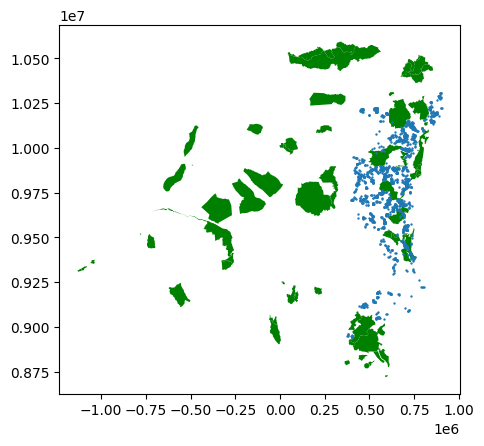

In [242]:
# Plot of the parks and mining sites
ax = national_parks_utm.plot(color='green')
mining_sites_utm.plot(ax=ax, markersize=0.5)
plt.show()

In [ ]:
# Mapa de los parque y sitios de minería ahora usando  alpha=0.5 para que los puntos de mining_site se grafiquen por tamaños
ax = _________________.plot(color='green')
________________________.plot(ax=ax, markersize=_______)
plt.show()

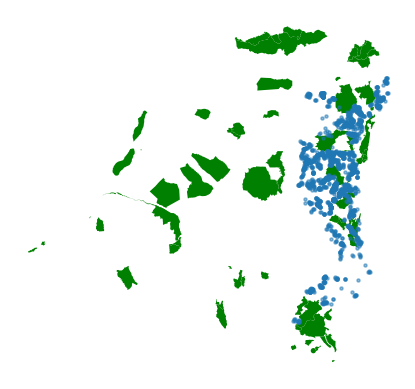

In [243]:
# Plot of the parks and mining sites
ax = national_parks.plot(color='green')
mining_sites.plot(ax=ax, markersize=5, alpha=0.5)
ax.set_axis_off()
plt.show()

In [ ]:
#Mapa de los parque y sitios de minería ahora pidiendo que mining_sites se coloree por tipo de mineral 
ax = _________________.plot(color='green')
________________________.plot(ax=ax, markersize=_______, __________, _____________)
plt.show()

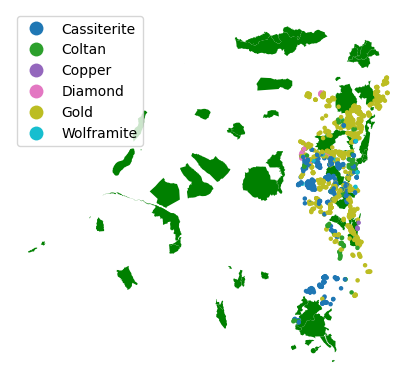

In [68]:
# Plot of the parks and mining sites
ax = national_parks.plot(color='green')
mining_sites.plot(ax=ax, markersize=5, column = 'mineral', legend=True)
ax.set_axis_off()
#contextily.add_basemap(ax)
plt.show()

### **<font color="SeaGreen"> Buffers, Zona de influencia alrededor de un punto</font>**  


Considere la ciudad de Goma, capital de la provincia de Kivu del Norte del Congo, cerca de la frontera con Ruanda. Sus coordenadas son 1,66°S 29,22°E (el punto ya se proporciona en coordenadas UTM como la variable goma).

¿Cuántos yacimientos mineros se encuentran a menos de 50 km de Goma? ¿Y qué extensión tiene el parque nacional? Determinémoslo mediante la operación de zona de influencia. Recuerde que las distancias deben expresarse en la unidad del CRS (es decir, en metros en este caso).

Nota: Si tiene una serie booleana (por ejemplo, como resultado de un método de relación espacial), puede calcular cuántos valores verdaderos (es decir, cuántas geometrías pasaron la comprobación) sumando esos valores booleanos, ya que, en ese caso, los valores verdaderos y falsos se verán como unos y ceros.

* Crea una zona de influencia de 50 km alrededor de goma y asígnala a la variable goma_buffer.
* Comprueba cuáles de los puntos de mining_sites se encuentran dentro de esta zona de influencia (y llámala máscara). Cuenta esos sitios sumando la máscara booleana e imprime el resultado.
* Calcula las intersecciones de los parques nacionales con la zona de influencia. Suma el área de esas intersecciones e imprime el resultado en km².

In [ ]:
#Ciudad de Goma
goma = geopandas.GeoSeries([Point(746989.5594829298, 9816380.942287602)],crs='EPSG:32735')
# Goma es un punto para esto usar punto.buffer(tamaño del area)
print(type(goma))

# Crear un buffer de 50km al rededor de Goma
goma_buffer = ____

# El buffer es un poligono
print(type(goma_buffer))

# Cuenten cuántas zonas mineras están cerca de goma
mask = ____
print(____)

# Calculen el área de los parques naciones que están en goma 
print(national_parks.____ / (1000**2))

In [72]:
goma = geopandas.GeoSeries([Point(746989.5594829298, 9816380.942287602)],crs='EPSG:32735')
# Create a buffer of 50km around Goma
goma_buffer = goma.buffer(50000)
# The buffer is a polygon
print(type(goma_buffer))
# Check how many sites are located within the buffer
mask = mining_sites_utm.within(goma_buffer.iloc[0])
print(mining_sites_utm[mask].count())

# Calculate the area of national park within the buffer
print(national_parks_utm.intersection(goma_buffer.iloc[0]).area.sum() / (1000**2))

<class 'geopandas.geoseries.GeoSeries'>
visit_date    87
name          87
n_workers     87
mineral       87
geometry      87
dtype: int64
1566.475590655187


### **<font color="SeaGreen">Sitios mineros dentro de parques nacionales </font>**  

Para este ejercicio, comencemos con uno de los parques nacionales, el Parque Nacional Kahuzi-Biega (que se extrajo del conjunto de datos national_parks y se proporciona como la variable kahuzi).

¿Cuáles de los sitios mineros se encuentran dentro de este parque nacional?
Y como segundo paso: ¿podemos determinar todos los sitios mineros que se encuentran dentro de uno de los parques nacionales y en qué parque?


1. Utilice el método within() para crear un subconjunto de los sitios mineros (mining_sites) ubicados en el parque nacional Kahuzi. Llame al resultado "sites_kahuzi".
2. Determine para cada sitio minero si se encuentra en un parque nacional y en qué parque nacional. Esto creará un GeoDataFrame similar a "mining_sites", pero con una columna adicional con el nombre del parque nacional. Llame a este resultado "sites_within_park".
4. Cuente el número de sitios en cada parque utilizando el método value_counts() en la columna "Nombre" de "sites_within_park".

In [ ]:
# Creamos el Kahuzi-Biega National park
kahuzi = national_parks_utm[national_parks_utm['nom_ap'] == "Kahuzi-Biega National park"].geometry.squeeze()

# Crea un subset de los sitioss mineros ubicados en (within) Kahuzi
mask = mining_sites_utm.geometry.apply(lambda geom: geom.within(kahuzi))
sites_kahuzi = ____
print(sites_kahuzi)

# Determina en qué parque nacional se encuentran los mining sites.
sites_within_park = geopandas.____(____, ____, predicate=____, how='inner')
print(sites_within_park.head())

# El número de sitios mineraos en cada parque nacional.
print(sites_within_park[____].____())

In [272]:
# Extraer el polígono único del parque nacional Kahuzi-Biega
kahuzi = national_parks_utm[national_parks_utm['nom_ap'] == "Kahuzi-Biega National park"].geometry.squeeze()

# Filtrar los sitios mineros que están dentro del parque
mask = mining_sites_utm.geometry.apply(lambda geom: geom.within(kahuzi))
sites_kahuzi = mining_sites_utm[mask]

# Mostrar los sitios mineros dentro del parque
print(sites_kahuzi)

     visit_date name  n_workers mineral geometry
0           NaT  NaN        NaN     NaN     None
1           NaT  NaN        NaN     NaN     None
2           NaT  NaN        NaN     NaN     None
3           NaT  NaN        NaN     NaN     None
4           NaT  NaN        NaN     NaN     None
...         ...  ...        ...     ...      ...
2138        NaT  NaN        NaN     NaN     None
2139        NaT  NaN        NaN     NaN     None
2140        NaT  NaN        NaN     NaN     None
2141        NaT  NaN        NaN     NaN     None
2142        NaT  NaN        NaN     NaN     None

[2143 rows x 5 columns]


In [274]:
# Determine in which national park a mining site is located
sites_within_park = geopandas.sjoin(mining_sites_utm, national_parks_utm, predicate='within', how='inner')
print(sites_within_park.head())

    visit_date           name  n_workers      mineral  \
253 2013-09-05   Kiviri/Tayna      244.0         Gold   
661 2013-08-28  Ibozia/Kalumé       80.0  Cassiterite   
662 2013-08-26        Matamba      150.0  Cassiterite   
663 2013-08-27  Mutete/Mukina      170.0  Cassiterite   
664 2013-08-28         Mutete      100.0  Cassiterite   

                           geometry  index_right  OBJECTID    type_  \
253   POINT (709734.913 9961013.72)           62       120  4100130   
661  POINT (567832.709 9759143.339)           53       109  4120400   
662  POINT (598323.539 9758688.142)           53       109  4120400   
663  POINT (570733.437 9761871.114)           53       109  4120400   
664  POINT (569881.093 9762219.111)           53       109  4120400   

                       desc_type                         nom_ap  ... wdpapid  \
253  Réserve naturelle intégrale     Réserve naturelle de Tayna  ...    None   
661                Parc national  Parc national du Kahuzi-Biega  ...  

In [275]:
# The number of mining sites in each national park
print(sites_within_park['nom_ap'].value_counts())

nom_ap
Réserve de faune de Kabobo                         20
Réserve naturelle d'Itombwe                        19
Parc national du Kahuzi-Biega                      11
Réserve naturelle de Ngandja                        9
Parc national de la Maiko                           7
Réserve de faune à okapis                           5
Domaine de chasse de Luama Katanga                  3
Réserve naturelle de Tayna                          1
Domaine de chasse de Fizi (Secteur de la Nemba)     1
Réserve de chasse de Luama Kivu                     1
Name: count, dtype: int64


Aplicación de una operación personalizada a cada geometría
Ahora que sabemos cómo obtener el parque nacional más cercano para un punto, haremos lo mismo para todos los puntos. Para ello, primero escribiremos una función que tome un punto como argumento y devuelva el resultado deseado. Después, podemos usar esta función para aplicarla a todos los puntos.

* Crea una función closer_national_park() que realice el análisis del ejercicio anterior: dado un único punto y todos los parques nacionales, devuelve el nombre del parque nacional más cercano.
* Como prueba, llama a esta función en el punto único (single_mine) e imprime el resultado. ¿Es igual que antes («Parque Nacional Virunga»)?
* Aplica esta función a todos los puntos de mining_sites y asigna el resultado a la columna «closest_park».

In [ ]:
# Get the geometry of the first row
single_mine = mining_sites.geometry[0]

# Define a function that returns the closest national park
def closest_national_park(geom, national_parks):
    dist = __________________________
    idx = ____________.idxmin()
    closest_park = national_parks.loc[______, 'nom_ap']
    return closest_park

# Call the function on single_mine
print(closest_national_park(____, ____))

# Apply the function to all mining sites
mining_sites['closest_park'] = mining_sites.geometry.____(____, ____=____)
print(mining_sites.head())

In [73]:
# Get the geometry of the first row
single_mine = mining_sites_utm.geometry[0]
# Define a function that returns the closest national park
def closest_national_park(geom, national_parks_utm):
    dist = national_parks_utm.distance(geom)
    idx = dist.idxmin()
    closest_park =  national_parks_utm.loc[idx, 'nom_ap']
    return closest_park

# Call the function on single_mine
print(closest_national_park(single_mine, national_parks))

# Apply the function to all mining sites
mining_sites_utm['closest_park'] = mining_sites_utm.geometry.apply(closest_national_park, national_parks_utm=national_parks_utm)
print(mining_sites.head())

/tmp/ipykernel_182/2130105375.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dist = national_parks_utm.distance(geom)


Réserve de faune du Bomu
  visit_date                                name  n_workers mineral  \
0 2013-03-27                           Mayi-Tatu      150.0    Gold   
1 2013-03-27                             Mabanga      115.0    Gold   
2 2013-03-27                             Molende      130.0    Gold   
3 2013-03-27                          Embouchure      135.0    Gold   
4 2013-03-27  Apumu-Atandele-Jerusalem-Luka Yayo      270.0    Gold   

                   geometry  
0  POINT (29.66033 1.01089)  
1  POINT (29.65862 1.00308)  
2  POINT (29.65629 0.98563)  
3  POINT (29.64494 0.99976)  
4       POINT (29.66 0.956)  


---
<a name='ej-1'></a>
### **<font color="DodgerBlue"> Ejercicio 1: En que distrito esta la reserva de verrieres </font>**

La reserva ecologica de verrieres tiene el identificador '147979-FR001L1' y esta en el GeoDataFrame land_use y green_areas. 
Usando el GeoDataFrame districts, encontrar en que distrito se encuentra.
    

<Axes: >

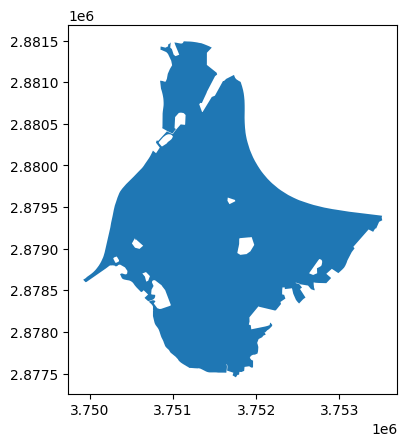

In [140]:
Verrieres = green_areas[green_areas['identifier']== '147979-FR001L1']
Verrieres.plot()

In [119]:
## ESte no me salio
#Verrieres = Verrieres.to_crs(districts.crs)
#verrieres_union = Verrieres.union_all()

# En cual distrito esta la reserva de verrieres?
#mask = districts.contains(verrieres_union)
#districts[mask]

,id,district_name,population,geometry


### **<font color="DodgerBlue"> Ejercicio 2: ¿Qué tan verde es el distrito de Muette? </font>**
<font color="DarkBlue"> 1. Creen un GeoDataFrame con la intersección del distrito de Muette y la información sobre las áreas verdes.

<font color="DarkBlue"> 2. Calculen la proporción de área que ocupan las áreas verdes en el distrito.

<font color="DarkBlue"> 3. Muestren un mapa de las áreas verdes de Muette.

In [ ]:

green_areas_muette =  geopandas.overlay(green_areas, muette, how='intersection')
green_areas_muette.head()

In [ ]:
green_areas_muette.plot(column='class_2012', legend = True)
